# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 6. Линейная регрессия.


**Правила, <font color="red">прочитайте внимательно</font>:**




* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.


**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком
    * *или* вставив ее в ноутбук посредством `Edit -> Insert Image` при редактировании markdown-ячейки (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). **<font color="red">Неправильно вставленные фотографии могут не передаться при отправке.</font>** Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.



**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 40 баллов
* Задача 2 &mdash; 80 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 50 баллов
* Задача 4 &mdash; 60 баллов
* Задача 5 &mdash; 30 баллов


In [130]:
# Bot check

# HW_ID: fpmi_ad6
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1.

Рассмотрим одномерную линейную регрессию без свободного параметра $y(x) = \theta x$, где $x\in \mathbb{R}$ и $\theta \in \mathbb{R}$. Предполагаем, что данные получены по правилу
$$Y_i = \theta x_i + \varepsilon_i,$$
где $i \in \{1, ..., n\}$, числа $x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i$ &mdash; случайные ошибки.

**1.** Посчитайте оценку $\widehat{\theta}$ методом наименьших квадратов по явной формуле.

* $\sum_{i=1}^n{(y_i - x_i \theta)^2} -> min$


* Дифференцируем по $\theta$: $-2\sum_{i=1}^n{x_i(y_i-x_i\theta)} = 0$, поделим на -2


* $\sum_{i=1}^n{x_i y_i} = \theta \sum_{i=1}^n{x_i^2}$


* $\widehat{\theta} = \dfrac{\sum_{i=1}^n{x_iy_i}}{\sum_{i=1}^n{x_i^2}}$

**2.** Выпишите формулы градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$. Не забудьте указать, как в SGD математически определяется батч (набор объектов на каждой итерации).

* GD: 

$\theta_{t+1} = \theta_t - \eta \sum_{i=1}^n x_i{(x_i \theta - y_i)}$


* SGD:

$\theta_{t+1} = \theta_t - \eta \dfrac{n}{k} \sum_{j=1}^k {(x_{i_j} \theta - y_{i_j})} $

где $i_1, ..., i_k \sim \cup \{1, ..., n\}$ с повторами. Выбор индексов происходит на каждом шаге.


**3.** Пусть $\mathsf{E}\varepsilon_i = 0$, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{E}\widehat{\theta}$ и $\mathsf{E}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$.

* $\mathsf{E}\widehat{\theta} = \mathsf{E}(\dfrac{\sum_{i=1}^n{x_iy_i}}{\sum_{i=1}^n{x_i^2}}) = 
     \mathsf{E}(\dfrac{\sum_{i=1}^n{x_i \theta x_i}}{\sum_{i=1}^n{x_i^2}}) = 
      \mathsf{E}(\theta\dfrac{\sum_{i=1}^n{x_i^2}}{\sum_{i=1}^n{x_i^2}}) = \theta
$


* $\mathsf{E}\widehat{y} = \mathsf{E}(\widehat{\theta} x) = \mathsf{E}\widehat{\theta} * \mathsf{E}x = 
x \theta
$

**4.** Пусть $\mathsf{E}\varepsilon_i = 0$ и $\mathsf{D}\varepsilon_i = \sigma^2$, причем все $\varepsilon_i$ независимы, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{D}\widehat{\theta}$ и $\mathsf{D}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$. 

* $\mathsf{D}(\widehat{\theta}) = \mathsf{D}(\dfrac{\sum_{i=1}^n{x_iy_i}}{\sum_{i=1}^n{x_i^2}}) = 
    \mathsf{D}(\dfrac{\sum_{i=1}^n{x_i(\theta x_i + \varepsilon_i)}}{\sum_{i=1}^n{x_i^2}}) =
     \mathsf{D}(\dfrac{\sum_{i=1}^n{x_i^2 \theta}}{\sum_{i=1}^n{x_i^2}} + \dfrac{\sum_{i=1}^n{x_i \varepsilon_i}}{\sum_{i=1}^n{x_i^2}}) = 
     \mathsf{D}(\theta) + (\dfrac{1}{\sum_{i=1}^n x_i^2})^2 * \mathsf{D}(\sum_{i=1}^n x_i \varepsilon_i) = 
     0 + (\dfrac{1}{\sum_{i=1}^n x_i^2})^2 * (\sum_{i=1}^n x_i^2) * \sigma^2 = 
     \dfrac{\sigma^2}{\sum_{i=1}^n x_i^2}
    $
    
    
* $\mathsf{D}(\widehat{y}) = \mathsf{D}(\widehat{\theta}x) = x^2 \mathsf{D}(\widehat{\theta}) =
    \dfrac{x^2 \sigma^2}{\sum_{i=1}^n x_i^2}
$


**5.** При каких условиях дисперсии в пункте 4 конечны? Подумайте и ответьте на вопрос, как ведет себя дисперсия предсказания в многомерном случае если матрица $X^T X$ близка к вырожденной.

* Если все $x_i$ близки к 0, то получим, что дисперсия для нашей задачи стремится к $+\infty$


* В многомерном случае аналогично можно получить, что вместо **знаменателя** $\sum_{i=1}^n x_i^2$ в **числителе** добавляется множитель $ (X^T X)^{-1}$, в свою очередь имеем $ (X^T X)^{-1} = \dfrac{A}{\Delta}$ , соответственно, если матрица $X^T X$ близка к вырожденной, то определитель $\Delta$ близок к нулю и **в числителе** вместо $(X^T X)^{-1}$ имеем $\approx +\infty * A $, где A - матрица алгебраических дополнений матрицы $X^T X$.


*Замечания.* 
1. В пунктах 3-5 речь идет о $\widehat{\theta}$, которая является *решением* задачи метода наименьших квадратов. Поэтому пользуйтесь явной формулой этого решения, а не формулами методов вычисления решения.
2. В ответе во всех пунктах могут оставаться суммы $n$ слагаемых, но не должно быть операций с векторами или матрицами.
3. **Прочитай требования к формату решения в правилах сдачи задания.**

---
### Задача 2.

Скоро лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.

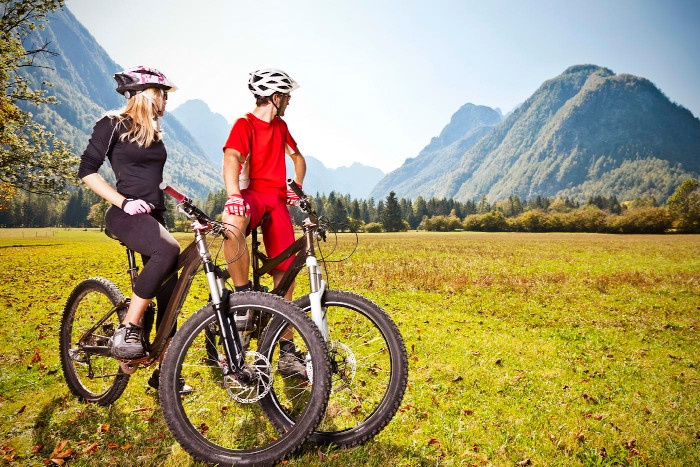

Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; зима, 2 &mdash; весна, 3 &mdash; лето, 4 &mdash; осень;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

Перед выполнением задания обязательно посмотрите <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html">ноутбук</a> с занятия по линейной регрессии.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [12]:
fields = ['season', 'mnth', 'holiday', 'weekday', 'workingday', 
          'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'cnt']

data = pd.read_csv('day.csv', usecols=fields)
train, test = train_test_split(data, test_size=0.2)

In [13]:
train.head()

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
195,3,7,0,5,1,1,0.663333,0.624371,0.591250,0.182833,5538
116,2,4,0,3,1,2,0.620000,0.575142,0.835417,0.312200,3872
247,3,9,1,1,0,2,0.673333,0.625646,0.790417,0.212696,3351
123,2,5,0,3,1,2,0.414167,0.404650,0.737083,0.328996,2633
576,3,7,0,1,1,1,0.730833,0.684987,0.668750,0.153617,7105


#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. Старайтесь строит информативные графики.

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

In [10]:
categorial_features = ['season', 'mnth', 'holiday', 'weekday', 'workingday', 
                       'weathersit']  # категориальные признаки
real_features = ['temp', 'atemp', 'hum', 'windspeed']  # вещественные признаки
target_feature = 'cnt'  # целевой признак

/home/yaroslav/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/yaroslav/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/yaroslav/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/yaroslav/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/yaroslav/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/yaroslav/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the dat

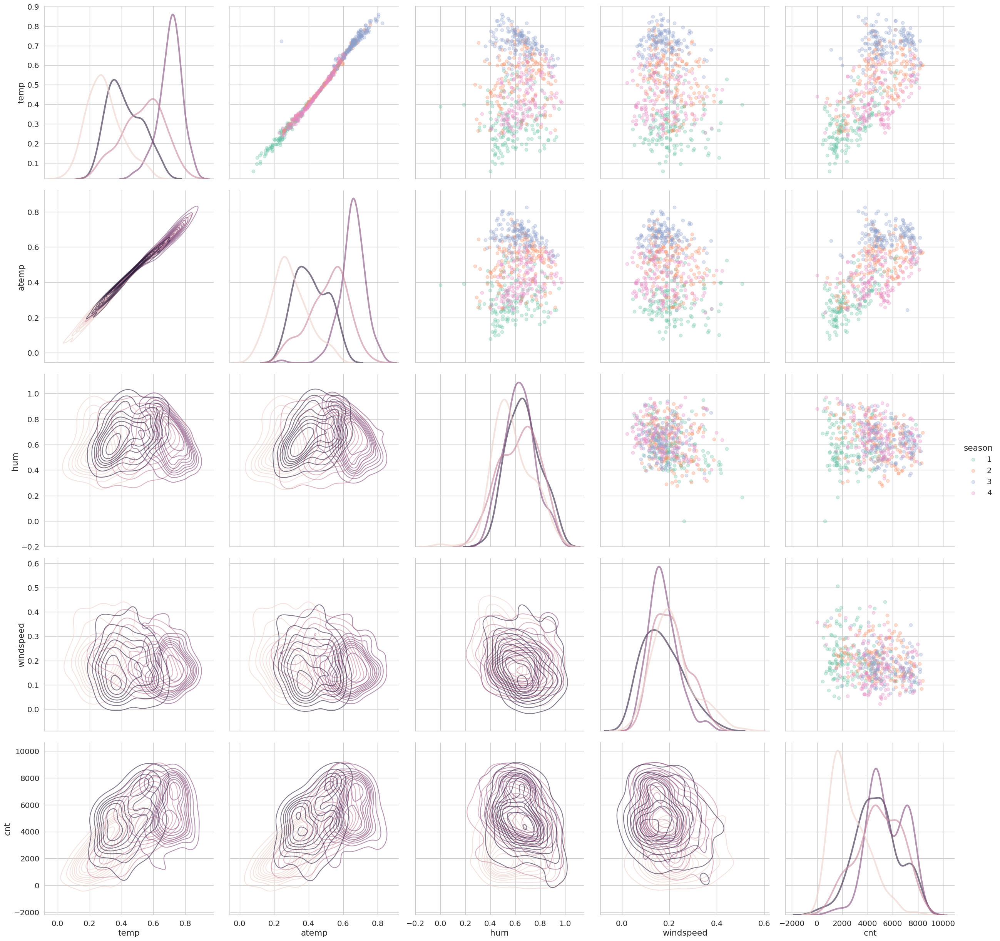

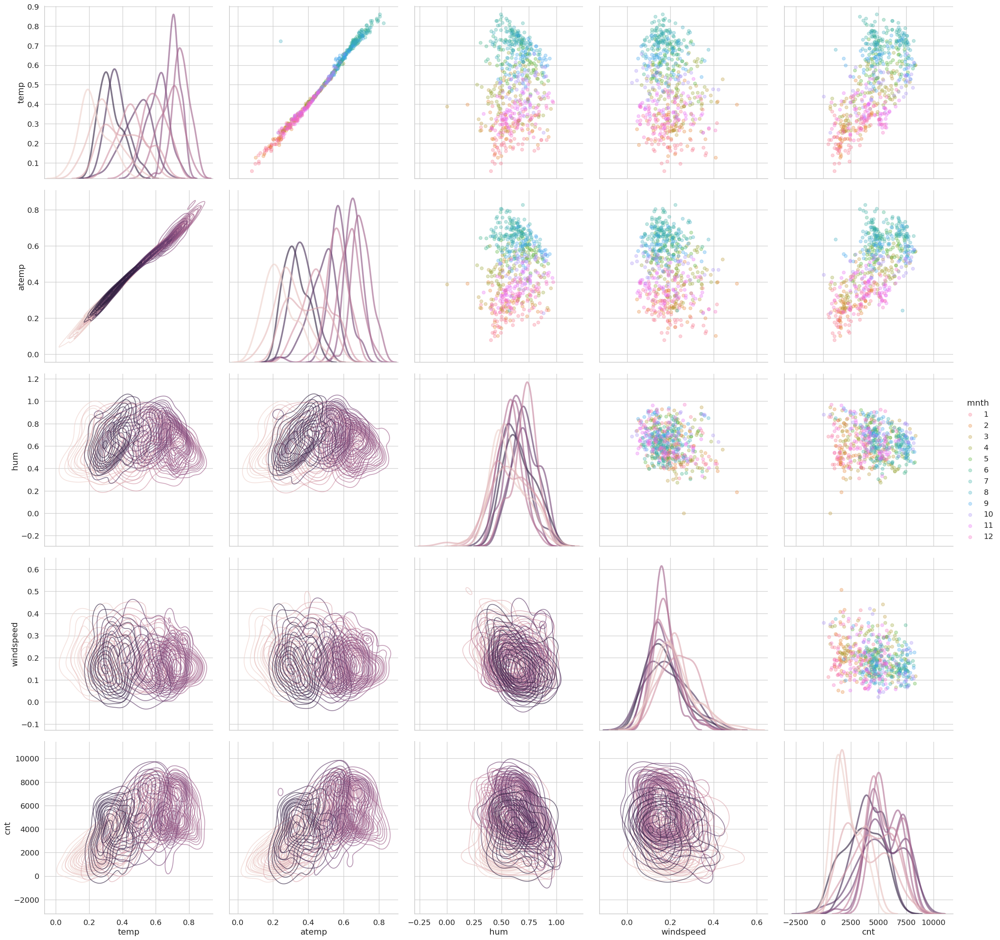

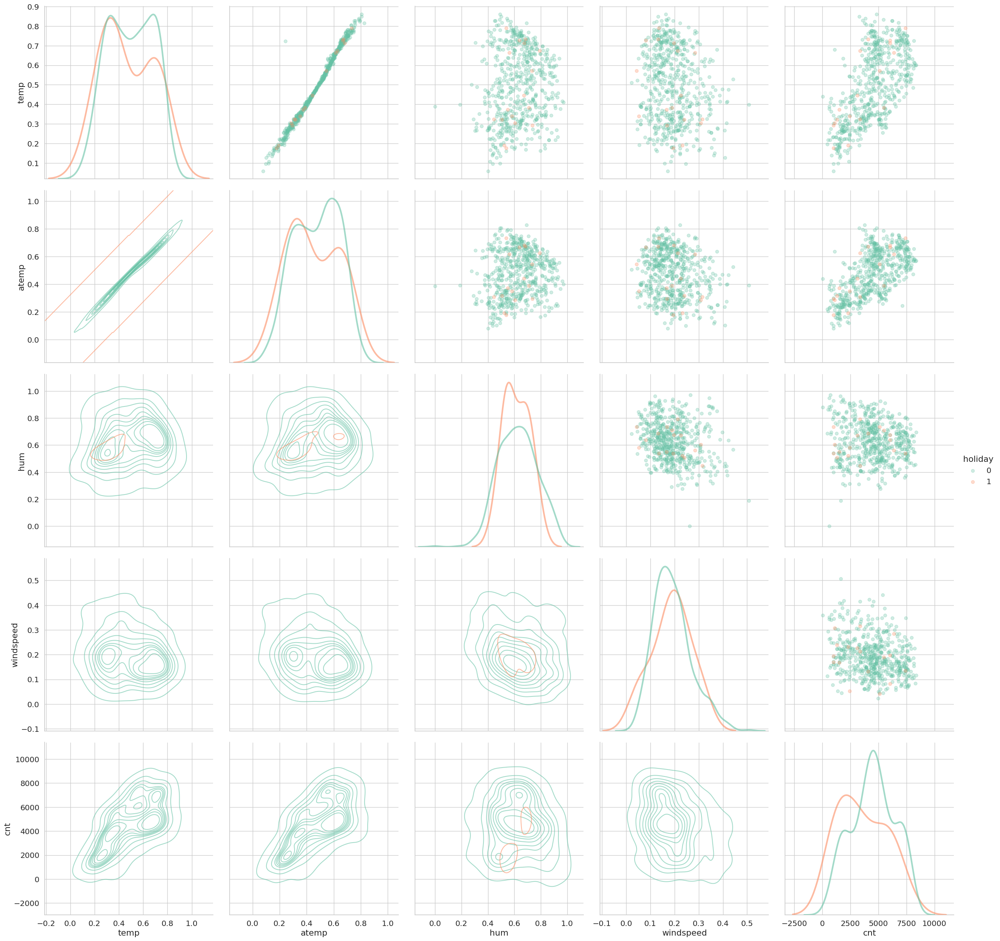

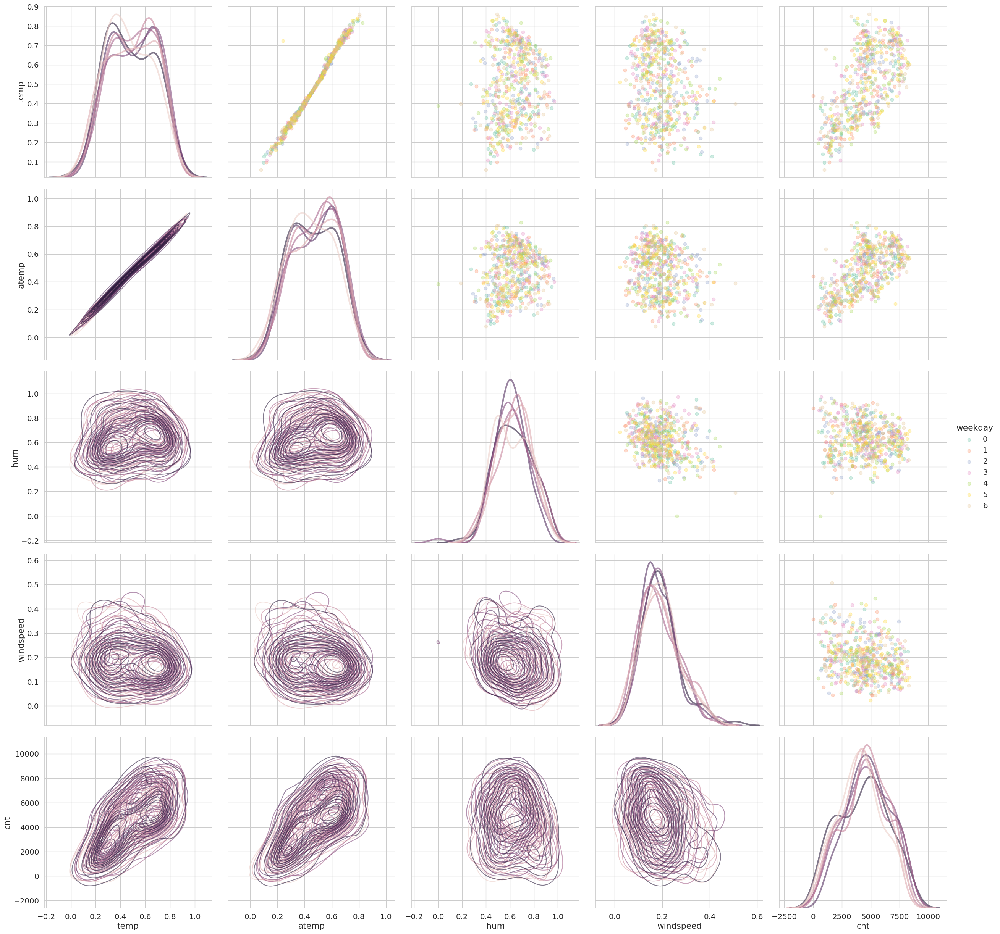

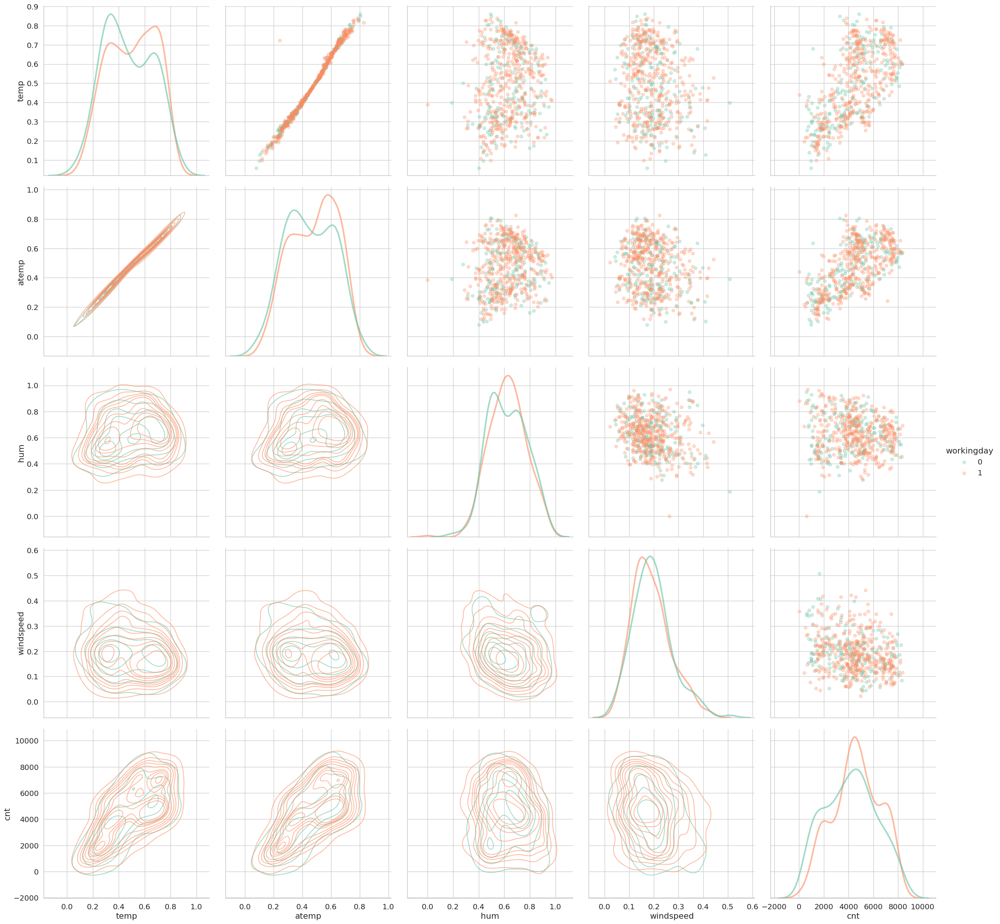

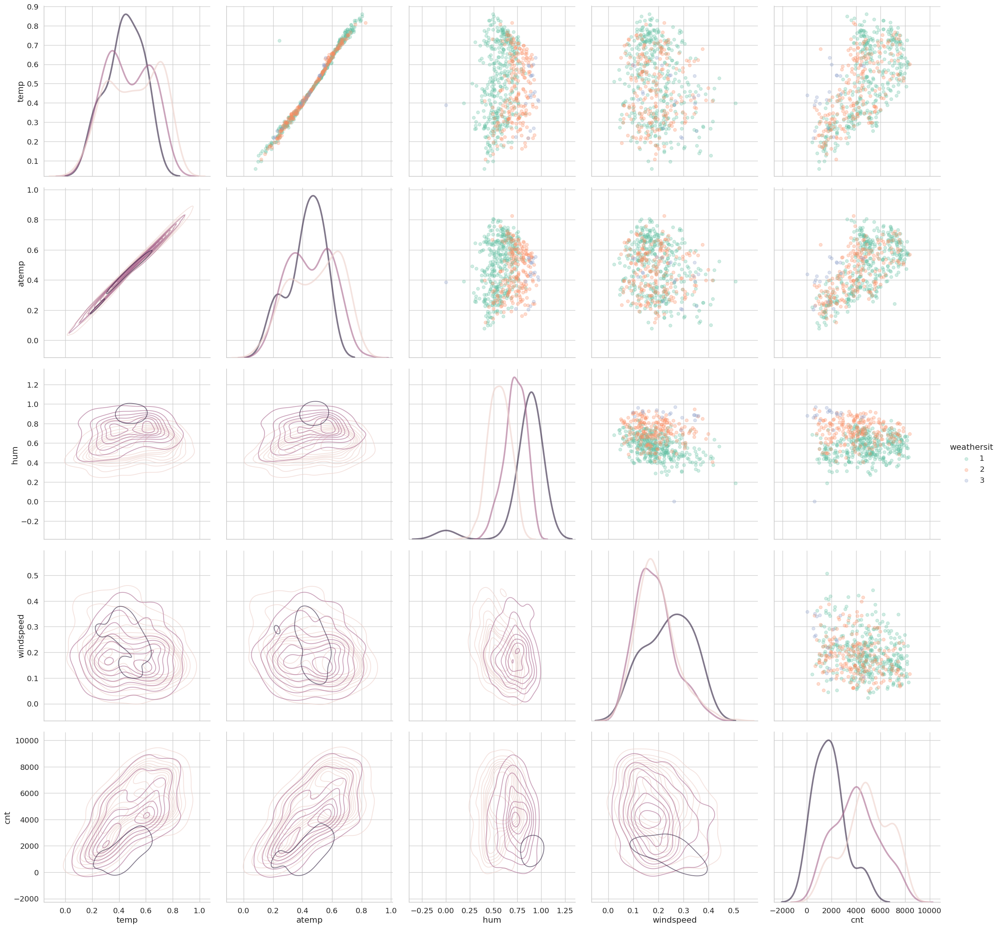

In [28]:
for hue in categorial_features:
    g = sns.PairGrid(train[[*real_features, target_feature, hue]], 
                     hue=hue, diag_sharey=False, height=5)
    
    g.map_lower(sns.kdeplot, alpha=0.6)
    g.map_upper(plt.scatter, alpha=0.3)
    g.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)  # каждая плотность по отдельности должна давать 1 при интегрировании
    
    g.add_legend()

## Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.



**Выводы по графикам:**

* В данных присутствует явная линейная зависимость между temp и atemp, поэтому в дальнейшем выкинем признак atemp, оставив только temp, так как явная линейная зависимость между признаками, как мы уже убедились выше, приводит к вырожденности матрицы $X^T X$, что в свою очередь негативно сказывается на работе линейной регрессии.


* Также присутствует некоторое количество выбросов, которые также выкинем на стадии предобработки данных.


* Видно, что целевой признак зависит больше от квадрата температуры, чем от просто температуры. Также на стадии предобработки данных сгенерируем признак квадрата температуры.

#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, что-то еще.

**Процедура предобработки данных:**

**а).** Разделим выборки на Х и Y.


**б).** Стандартизируем real_features с помощью StandardScaler. Это поможет понять какой признак внес более значимый вклад, вошел с наибольшим весом. Повышается интерпретируемость работы алгоритма линейной регрессии.


**в).** Удалим выбросы, оставив только данные которые лежат в пределах трех сигма по каждому признаку.


**г).** Удалим признак atemp.


**д).** Сгенерируем признак - квадрат температуры.


**е).** Осуществим one-hot кодирование категориальных признаков.

Реализуйте данную процедуру.

In [303]:
train.describe()

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
count,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000,584.000000
mean,2.508562,6.494863,0.029110,3.061644,0.693493,1.409247,0.494340,0.472843,0.626664,0.191633,4487.635274
std,1.108177,3.448714,0.168258,1.984408,0.461438,0.554399,0.185666,0.165393,0.145435,0.078446,1945.041105
min,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.079070,0.000000,0.022392,22.000000
25%,2.000000,3.000000,0.000000,1.000000,0.000000,1.000000,0.335417,0.334899,0.516458,0.134954,3123.750000
50%,3.000000,7.000000,0.000000,3.000000,1.000000,1.000000,0.496667,0.484838,0.624167,0.183467,4551.000000
75%,3.000000,9.000000,0.000000,5.000000,1.000000,2.000000,0.656875,0.609702,0.729583,0.233947,5892.750000
max,4.000000,12.000000,1.000000,6.000000,1.000000,3.000000,0.861667,0.826371,0.970417,0.507463,8362.000000


**Разделим выборки на X и y**

In [473]:
X_train, y_train = train[[*categorial_features, *real_features]], train[target_feature]
X_test, y_test = test[[*categorial_features, *real_features]], test[target_feature]

**Стандартизируем реальные признаки с помощью StandardScaler, не забыв сделать то же самое для тестовой части**

In [475]:
scaler = StandardScaler()
scaler.fit(X_train[real_features])
X_train.loc[:, real_features] = scaler.transform(X_train[real_features])
X_test.loc[:, real_features] = scaler.transform(X_test[real_features])

/tmp/ipykernel_2651/4156551642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, real_features] = scaler.transform(X_train[real_features])
/tmp/ipykernel_2651/4156551642.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[:, real_features] = scaler.transform(X_test[real_features])


**Посмотрим на количество выбросов по каждому признаку и выкинем их**

In [476]:
X_train

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed
195,3,7,0,5,1,1,0.910975,0.916956,-0.243713,-0.112273
116,2,4,0,3,1,2,0.677383,0.619052,1.436598,1.538256
247,3,9,1,1,0,2,0.964881,0.924672,1.126917,0.268734
123,2,5,0,3,1,2,-0.432185,-0.412662,0.759882,1.752548
576,3,7,0,1,1,1,1.274842,1.283768,0.289627,-0.485025
...,...,...,...,...,...,...,...,...,...,...
65,1,3,0,1,1,1,-1.253866,-1.418338,-0.518614,1.910192
299,4,10,0,4,1,2,-0.131210,-0.095594,1.281757,0.078211
266,4,9,0,6,0,2,0.605510,0.554121,1.622978,-1.444895
330,4,11,0,0,0,1,-0.189607,-0.103134,0.493212,0.220992


In [477]:
for i, name in enumerate(real_features):
    print(name, ':', X_train[real_features[i]].apply(lambda x: x < -3 or x > 3).sum())

temp : 0
atemp : 0
hum : 2
windspeed : 2


In [478]:
X_train.loc[:, 'hum'] = X_train.hum.apply(lambda x: None if x < -3 or x > 3 else x)
X_train.loc[:, 'windspeed'] = X_train.windspeed.apply(lambda x: None if x < -3 or x > 3 else x)

/tmp/ipykernel_2651/4190890489.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, 'hum'] = X_train.hum.apply(lambda x: None if x < -3 or x > 3 else x)
/tmp/ipykernel_2651/4190890489.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, 'windspeed'] = X_train.windspeed.apply(lambda x: None if x < -3 or x > 3 else x)


In [479]:
X_train.shape

(584, 10)

In [480]:
X_train.dropna(inplace=True)
X_train.shape

/tmp/ipykernel_2651/460321710.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.dropna(inplace=True)


(581, 10)

Уберем также наблюдения, соответствующие выбросам в y_train

In [481]:
y_train = y_train.loc[X_train.index, ]

In [482]:
X_train = X_train.reset_index(drop=True)

In [483]:
y_train = y_train.reset_index(drop=True)

**Удалим признак atemp.**

In [484]:
X_train.drop(columns=['atemp'], inplace=True)

In [485]:
X_train.head()

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed
0,3,7,0,5,1,1,0.910975,-0.243713,-0.112273
1,2,4,0,3,1,2,0.677383,1.436598,1.538256
2,3,9,1,1,0,2,0.964881,1.126917,0.268734
3,2,5,0,3,1,2,-0.432185,0.759882,1.752548
4,3,7,0,1,1,1,1.274842,0.289627,-0.485025


**Сгенерируем признак - квадрат температуры sq_temp.**

In [486]:
X_train.loc[:, 'sq_temp'] = X_train.temp**2

**Осуществим one-hot кодирование категориальных признаков.**

In [487]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
encoder.fit(X_train[categorial_features])  # обучаем и кодируем

train_cat = encoder.transform(X_train[categorial_features])
test_cat = encoder.transform(X_test[categorial_features])

In [488]:
encoder.get_feature_names_out()

array(['season_2', 'season_3', 'season_4', 'mnth_2', 'mnth_3', 'mnth_4',
       'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9', 'mnth_10',
       'mnth_11', 'mnth_12', 'holiday_1', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'workingday_1',
       'weathersit_2', 'weathersit_3'], dtype=object)

In [489]:
train_real = X_train.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]

In [490]:
X_train = np.hstack([train_real, train_cat])

#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов (в т.ч. свободный коэффициент).

In [491]:
model = LinearRegression(fit_intercept=True)  # объявляем модель
model.fit(X_train, y_train)  # обучаем

LinearRegression()

In [492]:
model.coef_

array([ 1091.8329845 ,  -552.80083335,  -350.85780268,  -531.96420784,
         601.88121796,   748.81322873,  1684.16249868,  -395.94368428,
        -344.88977436,  -454.80309152,  -291.43639396,  -524.76093748,
        -730.11425586,  -529.85251546,  -339.36768709,  -722.87814275,
       -1278.24967877,  -780.54699133,  -387.04796467,  -106.09217191,
          11.20479501,     7.67383219,   -42.99256915,    75.06981459,
         357.0787401 ,   331.91166539,  -208.07599258, -1731.36303153])

**Посмотрим, какие признаки вошли с наибольшими коэффициентами**

In [493]:
features_a = np.array(['temp', 'hum', 'windspeed', 'sq_temp'])
features_b = encoder.get_feature_names_out()
features_names = np.hstack([features_a, features_b])
named_features = list(zip(features_names, model.coef_))
named_features

[('temp', 1091.8329844988461),
 ('hum', -552.8008333498085),
 ('windspeed', -350.85780268098654),
 ('sq_temp', -531.964207838817),
 ('season_2', 601.8812179602044),
 ('season_3', 748.8132287261424),
 ('season_4', 1684.1624986821394),
 ('mnth_2', -395.94368427524074),
 ('mnth_3', -344.8897743566261),
 ('mnth_4', -454.80309151935205),
 ('mnth_5', -291.4363939572151),
 ('mnth_6', -524.7609374809884),
 ('mnth_7', -730.1142558606082),
 ('mnth_8', -529.852515461281),
 ('mnth_9', -339.36768708950257),
 ('mnth_10', -722.8781427533596),
 ('mnth_11', -1278.249678773094),
 ('mnth_12', -780.5469913274217),
 ('holiday_1', -387.0479646653114),
 ('weekday_1', -106.09217191139479),
 ('weekday_2', 11.204795010479843),
 ('weekday_3', 7.673832189212929),
 ('weekday_4', -42.99256914941494),
 ('weekday_5', 75.06981458839086),
 ('weekday_6', 357.0787400956098),
 ('workingday_1', 331.9116653925942),
 ('weathersit_2', -208.07599258293706),
 ('weathersit_3', -1731.3630315322534)]

In [494]:
model.intercept_

4672.99377519619

In [495]:
X_test.drop(columns=['atemp'], inplace=True)
X_test.loc[:, 'sq_temp'] = X_test.temp**2
test_real = X_test.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]

X_test = np.hstack([test_real, test_cat])

/tmp/ipykernel_2651/1069295514.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.drop(columns=['atemp'], inplace=True)
/tmp/ipykernel_2651/1069295514.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[:, 'sq_temp'] = X_test.temp**2


Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать, но в то же время выбросы вносят существенный вклад в значение метрики. 

In [496]:
test_preds = model.predict(X_test)

In [497]:
metrics.mean_squared_error(test[target_feature], test_preds) ** 0.5

1263.6254660918246

In [498]:
metrics.mean_absolute_error(test[target_feature], test_preds)

1097.657067516269

In [499]:
metrics.mean_absolute_percentage_error(test[target_feature], test_preds)

0.31229928386283806

In [500]:
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()
mean_absolute_percentage_error(test[target_feature], test_preds)

31.229928386283813

Для полученной линейной регрессии имеем:

**RMSE = 1263**

**MAE = 1097**

**MAPE = 31\%**

Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. Не забудьте про константный признак. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками.

In [516]:
theta_analyt = np.linalg.pinv(X_train).dot(y_train)

Выведем коэффициенты различных признаков. 

In [517]:
res = pd.DataFrame([(i[0][0], i[0][1], i[1]) for i in list(zip(named_features, theta_analyt))]).set_index(0)
res.columns = ['Theta SklearnLinreg', 'Theta Analytical']
res.loc[:, 'Разница sklearn - analytical'] = res['Theta SklearnLinreg'] - res['Theta Analytical']
res

,Theta SklearnLinreg,Theta Analytical,Разница sklearn - analytical
0,,,
temp,1091.832984,171.733159,920.099826
hum,-552.800833,-539.176344,-13.624490
windspeed,-350.857803,-312.116506,-38.741297
sq_temp,-531.964208,-30.519826,-501.444382
season_2,601.881218,542.604026,59.277192
season_3,748.813229,829.411817,-80.598589
season_4,1684.162499,2009.811911,-325.649413
mnth_2,-395.943684,1680.421222,-2076.364906
mnth_3,-344.889774,2611.208873,-2956.098647


Коэффициенты не сходятся, потому что имеются линейнозависимые признаки

Исправьте эту проблему, посчитайте оценки коэффициентов, а также ошибку предсказания.

Посмотрим коррелирующие признаки

In [518]:
corr = pd.DataFrame(X_train).corr()
ind = []
for i in range(28):
    for j in range(28):
        print([features_names[i],features_names[j]]) if (corr > 0.5).loc[i, j] and i!=j else 0

['temp', 'season_3']
['season_2', 'mnth_4']
['season_2', 'mnth_5']
['season_3', 'temp']
['season_3', 'mnth_7']
['season_3', 'mnth_8']
['season_4', 'mnth_10']
['season_4', 'mnth_11']
['mnth_4', 'season_2']
['mnth_5', 'season_2']
['mnth_7', 'season_3']
['mnth_8', 'season_3']
['mnth_10', 'season_4']
['mnth_11', 'season_4']


Проблема заключается в том, что осталась явная линейная зависимость между признаком season и между признаком month. Также осталась зависимость между season_3 и temp. Удалим признак season и запустим всё заново.

In [532]:
new_cat_features = ['mnth', 'holiday', 'weekday', 'workingday', 
                       'weathersit']
X_train, y_train = train[[*categorial_features, *real_features]], train[target_feature]
X_test, y_test = test[[*categorial_features, *real_features]], test[target_feature]

# real_features
for i, name in enumerate(real_features):
    print(name, ':', X_train[real_features[i]].apply(lambda x: x < -3 or x > 3).sum())
X_train.loc[:, 'hum'] = X_train.hum.apply(lambda x: None if x < -3 or x > 3 else x)
X_train.loc[:, 'windspeed'] = X_train.windspeed.apply(lambda x: None if x < -3 or x > 3 else x)
X_train.dropna(inplace=True)
X_train.shape
y_train = y_train.loc[X_train.index, ]
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_train.drop(columns=['atemp'], inplace=True)
X_train.loc[:, 'sq_temp'] = X_train.temp**2

# cat_features
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
encoder.fit(X_train[new_cat_features])  # обучаем и кодируем
train_cat = encoder.transform(X_train[new_cat_features])
test_cat = encoder.transform(X_test[new_cat_features])
encoder.get_feature_names_out()

# join
train_real = X_train.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]
# train_real = X_train.loc[:, ['temp', 'hum', 'windspeed']]

X_train = np.hstack([train_real, train_cat])
model = LinearRegression(fit_intercept=True)  # объявляем модель
model.fit(X_train, y_train)  # обучаем
model.coef_
features_a = np.array(['temp', 'hum', 'windspeed', 'sq_temp'])
# features_a = np.array(['temp', 'hum', 'windspeed'])

features_b = encoder.get_feature_names_out()
features_names = np.hstack([features_a, features_b])
named_features = list(zip(features_names, model.coef_))
named_features
X_test.drop(columns=['atemp'], inplace=True)
X_test.loc[:, 'sq_temp'] = X_test.temp**2
test_real = X_test.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]
# test_real = X_test.loc[:, ['temp', 'hum', 'windspeed']]


X_test = np.hstack([test_real, test_cat])
test_preds = model.predict(X_test)
metrics.mean_squared_error(test[target_feature], test_preds) ** 0.5
metrics.mean_absolute_error(test[target_feature], test_preds)
metrics.mean_absolute_percentage_error(test[target_feature], test_preds)
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()
mean_absolute_percentage_error(test[target_feature], test_preds)
theta_analyt = np.linalg.pinv(X_train).dot(y_train)
res = pd.DataFrame([(i[0][0], i[0][1], i[1]) for i in list(zip(named_features, theta_analyt))]).set_index(0)
res.columns = ['Theta SklearnLinreg', 'Theta Analytical']
res.loc[:, 'Разница sklearn - analytical'] = res['Theta SklearnLinreg'] - res['Theta Analytical']
res

temp : 0
atemp : 0
hum : 0
windspeed : 0


/tmp/ipykernel_2651/1172855204.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, 'hum'] = X_train.hum.apply(lambda x: None if x < -3 or x > 3 else x)
/tmp/ipykernel_2651/1172855204.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, 'windspeed'] = X_train.windspeed.apply(lambda x: None if x < -3 or x > 3 else x)
/tmp/ipykernel_2651/1172855204.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

,Theta SklearnLinreg,Theta Analytical,Разница sklearn - analytical
0,,,
temp,21299.504944,23965.052953,-2665.548009
hum,-3188.898343,-2762.740078,-426.158264
windspeed,-4671.267491,-4149.956553,-521.310938
sq_temp,-15657.602818,-18317.920348,2660.317530
mnth_2,-448.852605,-419.086035,-29.766570
mnth_3,-151.075961,-219.861682,68.785720
mnth_4,154.733842,47.910061,106.823780
mnth_5,236.962476,117.808681,119.153794
mnth_6,130.144925,127.207279,2.937647


In [534]:
corr = pd.DataFrame(X_train).corr()
ind = []
for i in range(24):
    for j in range(24):
        print([features_names[i],features_names[j]]) if (corr > 0.5).loc[i, j] and i!=j else 0

['temp', 'sq_temp']
['sq_temp', 'temp']
['sq_temp', 'mnth_7']
['mnth_7', 'sq_temp']


In [535]:
print("MSE", metrics.mean_squared_error(test[target_feature], test_preds) ** 0.5)
print("MAE", metrics.mean_absolute_error(test[target_feature], test_preds))
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()
print("MAPE", mean_absolute_percentage_error(test[target_feature], test_preds),"%")

MSE 1264.125132762668
MAE 1094.8015351686754
MAPE 30.31768817872621 %


Сделайте выводы.

**Выводы:**
Заметим, что после того, как дополнительно убрали линейную зависимость между seasons и остальными признаками, удалив признак seasons, ошибки модели упали. Причем аналитическое решение начало примерно совпадать с решением, полученным с помощью sklearn.

*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

### <font color="orange"><i>Сложная часть</i></font>

### Задача 3.

Как можно было увидеть ранее, оценки коэффициентов становятся слишком большими при наличии некоторых проблем с данными. Чтобы этого не происходило, часто выполняют процедуру *регуляризации* в модели. 

Пусть $X \in \mathbb{R}^{n \times d}$ &mdash; матрица признаков, $Y \in \mathbb{R}^{n}$ &mdash; вектор значений целевого признака, $\theta \in \mathbb{R}^{d}$ &mdash; неизвестный вектор параметров. В методе наименьших квадратов решается задача
$$\| Y - X\theta \|^2 \longrightarrow \min_\theta.$$
Регуляризация заключается в искусственном усечении значений вектора оценок коэффициентов путем добавления его нормы к оптимизируемому функционалу. Тем самым решается задача
$$\| Y - X\theta \|^2 + \lambda \| \theta \|^2 \longrightarrow \min_\theta,$$
где $\lambda > 0$ &mdash; гиперпараметр модели, то есть число, которое задается пользователем. Такая модель называется **Ridge-регрессией**.

*Замечание.* Такая модель дает некоторое *другое приближение* неизвестной зависимости. Но неправильно думать, что она не может дать "правильный" ответ, потому как понятия "правильный ответ" в подобных задачах не существует. Можно получить только *более качественное приближение* согласно выбранной метрике, например, RMSE.

**1.** Найдите оценку $\theta$ в модели ridge-регрессии. Сравните ее с оценкой коэффициентов в методе наименьших квадратов. Помогает ли она избавиться от проблемы обратимости матрицы в МНК, которая обсуждалась на занятии?

* $||Y - X\theta||^2 + \lambda ||\theta||^2 -> min$


* $ (Y - X\theta)^T (Y - X\theta) + \lambda \theta^T \theta -> min   $


* Возьмем производную: $ -2 Y^TX + 2 \theta^T X^T X + 2\lambda \theta^T$


* Тогда: $-2 X^T Y + 2 X^T X \theta + 2 \theta \lambda = 0$


* $\widehat{\theta} = (X^T X + \lambda E)^{-1} X^T Y$


* Видим, что если $X^T X$ имеет линейно зависимые строки (столбцы), то добавлением к ней единичной матрицы, линейная зависимость пропадает и определитель становится не равным нулю. Следовательно, регуляризация помогает избавиться от проблемы обратимости матрицы.

**2.** Выпишите формулу поиска оценки коэффициентов методом *градиентного спуска* и *стохастического градиентного спуска* для модели ridge-регрессии. Не забудьте указать, как математически определяется батч (набор объектов на каждой итерации).

* GD:

    $\theta_{t+1} = \theta_t - \eta (X^T_{PxN} (X_{NxP}\theta_{Px1} - Y_{Nx1}) + \lambda \theta_{Px1})$


* SGD:

     $\theta_{t+1} = \theta_t - \eta (X^T_{PxB} (X_{BxP}\theta_{Px1} - Y_{Bx1}) + \lambda \theta_{Px1})$

где B - фиксированный размер батча. Батч состоит из B строк с индексами $i_1, ..., i_k \sim \cup \{1, ..., n\}$ с повторами. Выбор индексов происходит на каждом шаге.

**3.** Многие модели машинного обучения требуют *стандартизацию признаков*. Существует множество различных способов стандартизации, из которых наиболее распространены два следующих.
1. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html"><it>StandardScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ &mdash; выборочное среднее значение признака $j$ (функция `np.mean`), а $s^2_j$ &mdash; выборочную дисперсию признака $j$ (функция `np.var`). Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{s_j}.$$
2. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html"><it>MinMaxScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ и $M_j$ &mdash; минимальное и максимальное значения признака $j$ соответственно. Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{M_j - m_j}.$$

Для метода наименьших квадратов стандартизацию признаков можно не производить, однако для модели ridge-регрессии стандартизация необходима. Поясните это. Можно представить, что признаки имеют некоторые различные единицы измерения.

* Задача оптимизации для Ridge регрессии формулируется как: $||Y - X\theta||^2 + \lambda ||\theta||^2 -> min$
* Разные признаки имеют разные размерности, поэтому минимизируя $\lambda ||\theta||^2$ мы будем минимизировать разные признаки с разной степенью качества. То есть вклад минимизации в отдельный признак будет зависеть от его размерности, поэтому нужно стандартизировать исходные данные.
* В задаче же регрессии обычным методом МНК нет регуляризационного члена $\lambda ||\theta||^2$, из-за чего происходит "честная" минимизация.


### Задача 4.

В данной задаче мы продолжим анализировать данные велопроката из задачи 2.

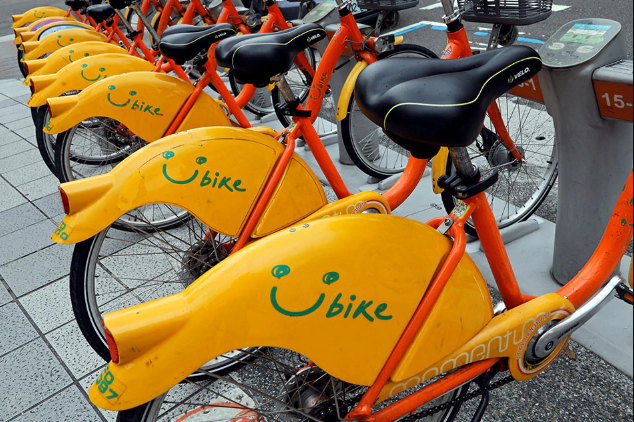

Для начала реализуйте класс для работы с моделью ridge-регрессии, используя явную формулу из предыдущей задачи. Интерфейс этого класса соответствует стандарту библиотеки `sklearn`, который использует также множество других библиотек.

In [15]:
class RidgeRegression:
    def __init__(self, lambd=0.1, fit_intercept=True):
        '''
        Инициализация модели.
        
        Аргументы:
        lambd -- параметр регуляризации.
        fit_intercept -- добавить ли константный признак.
        '''
        
        self.lambd = lambd
        self.fit_intercept = fit_intercept
        
        
    def fit(self, X, Y):
        '''
        Обучение модели ridge-регрессии.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        Y -- numpy-вектор значений целевого признака размера (n,).
        '''
        
        # Посчитайте оценки коэффициентов и, возможно, 
        # еще что-то, что пригодится в predict.
        
        if self.fit_intercept:
            X = np.hstack([X, np.ones((X.shape[0], 1))])
        self.theta = (np.linalg.inv(X.T.dot(X) + self.lambd * np.eye(X.shape[1]))) \
                                                                                    .dot(X.T).dot(Y)
        
        return self
    
    
    def predict(self, X):
        '''
        Вычисление предсказаний.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        
        Возвращает:
        predictions -- предсказания в виде numpy-вектора размера (n,).
        '''
        
        # Посчитайте предсказания
        if self.fit_intercept:
            X = np.hstack([X, np.ones((X.shape[0], 1))])
        predictions = X.dot(self.theta)
        
        return predictions

Разделите данные на три части &mdash; обучающую, валидационную и тестовую в соотношении 3:1:1. На первой из них вам необходимо проводить всю аналитику и обучать все модели &mdash; регрессию, скалирование и т.д.. Вторую вы будете использовать для выбора оптимального значения гиперпараметра. Наконец, тестовую выборку необходимо использовать только для вычисления итогового значения метрик выбранной модели. Именно эти числа вам нужно говорить заказчику.

Подробнее посмотрите в <a href="https://miptstats.github.io/courses/ad_fivt/ML_pipeline.pdf">презентации</a> с занятия.

In [6]:
df = pd.read_csv('day.csv')
df

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


In [7]:
train, test = train_test_split(df, test_size=0.2, random_state=1)
train, val = train_test_split(train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

In [8]:
train.shape, test.shape, val.shape

((438, 16), (147, 16), (146, 16))

Выполните необходимые преобразования признаков. Не забудьте, что <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#2.-Обучение">обучить преобразования</a> нужно только по обучающей выборке. Учтите все особенности, которые обсуждались ранее в данном задании.

In [11]:
new_cat_features = ['mnth', 'holiday', 'weekday', 'workingday', 
                       'weathersit']

categorial_features = ['season', 'mnth', 'holiday', 'weekday', 'workingday', 
                       'weathersit']  # категориальные признаки
real_features = ['temp', 'atemp', 'hum', 'windspeed']  # вещественные признаки
target_feature = 'cnt'  # целевой признак

X_train, y_train = train[[*categorial_features, *real_features]], train[target_feature]
X_test, y_test = test[[*categorial_features, *real_features]], test[target_feature]
X_val, y_val = val[[*categorial_features, *real_features]], val[target_feature]


# real_features
for i, name in enumerate(real_features):
    print(name, ':', X_train[real_features[i]].apply(lambda x: x < -3 or x > 3).sum())
X_train.loc[:, 'hum'] = X_train.hum.apply(lambda x: None if x < -3 or x > 3 else x)
X_train.loc[:, 'windspeed'] = X_train.windspeed.apply(lambda x: None if x < -3 or x > 3 else x)
X_train.dropna(inplace=True)
X_train.shape
y_train = y_train.loc[X_train.index, ]
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_train.drop(columns=['atemp'], inplace=True)
X_train.loc[:, 'sq_temp'] = X_train.temp**2

# cat_features
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
encoder.fit(X_train[new_cat_features])  # обучаем и кодируем
train_cat = encoder.transform(X_train[new_cat_features])
test_cat = encoder.transform(X_test[new_cat_features])
val_cat = encoder.transform(X_val[new_cat_features])
encoder.get_feature_names_out()

# join
train_real = X_train.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]
# train_real = X_train.loc[:, ['temp', 'hum', 'windspeed']]

X_train = np.hstack([train_real, train_cat])

temp : 0
atemp : 0
hum : 0
windspeed : 0


/tmp/ipykernel_6834/3805516550.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, 'hum'] = X_train.hum.apply(lambda x: None if x < -3 or x > 3 else x)
/tmp/ipykernel_6834/3805516550.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.loc[:, 'windspeed'] = X_train.windspeed.apply(lambda x: None if x < -3 or x > 3 else x)
/tmp/ipykernel_6834/3805516550.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentati

In [12]:
features_a = np.array(['temp', 'hum', 'windspeed', 'sq_temp'])
# features_a = np.array(['temp', 'hum', 'windspeed'])
features_b = encoder.get_feature_names_out()
features_names = np.hstack([features_a, features_b])
# named_features = list(zip(features_names, model.coef_))
# named_features
X_test.drop(columns=['atemp'], inplace=True)
X_test.loc[:, 'sq_temp'] = X_test.temp**2
test_real = X_test.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]
# test_real = X_test.loc[:, ['temp', 'hum', 'windspeed']]


X_test = np.hstack([test_real, test_cat])

/tmp/ipykernel_6834/1159945162.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.drop(columns=['atemp'], inplace=True)
/tmp/ipykernel_6834/1159945162.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.loc[:, 'sq_temp'] = X_test.temp**2


In [13]:
features_a = np.array(['temp', 'hum', 'windspeed', 'sq_temp'])
# features_a = np.array(['temp', 'hum', 'windspeed'])
features_b = encoder.get_feature_names_out()
features_names = np.hstack([features_a, features_b])
# named_features = list(zip(features_names, model.coef_))
# named_features
X_val.drop(columns=['atemp'], inplace=True)
X_val.loc[:, 'sq_temp'] = X_val.temp**2
val_real = X_val.loc[:, ['temp', 'hum', 'windspeed', 'sq_temp']]
# test_real = X_test.loc[:, ['temp', 'hum', 'windspeed']]


X_val = np.hstack([val_real, val_cat])

/tmp/ipykernel_6834/931975663.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_val.drop(columns=['atemp'], inplace=True)
/tmp/ipykernel_6834/931975663.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_val.loc[:, 'sq_temp'] = X_val.temp**2


Определите сетку значений гиперпараметра $\lambda$ и обучите для каждого значения сетки модель ridge-регрессии. Обычно эффективнее брать сетку в логарифмическом масштабе, воспользовавшись `np.logspace`.

In [16]:
models = {}

for lambd in np.logspace(-5, 3, 50):
    model = RidgeRegression(lambd=lambd)
    model.fit(X_train, y_train)
#     model.coef_
    models.update({lambd:model})

Для каждой из них посчитайте ошибку по метрикам RMSE, MAE, MAPE по обучающей и валидационной выборкам. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

In [17]:
RMSE_train = {}
MAE_train = {}
MAPE_train = {}

RMSE_val = {}
MAE_val = {}
MAPE_val = {}

def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()

for lambd, model in models.items():
    train_preds = model.predict(X_train)
    val_preds = model.predict(X_val)

    RMSE_train.update({lambd:metrics.mean_squared_error(y_train, train_preds) ** 0.5}) # RMSE
    MAE_train.update({lambd:metrics.mean_absolute_error(y_train, train_preds)}) # MAE
    MAPE_train.update({lambd:mean_absolute_percentage_error(y_train, train_preds)}) # MAPE
    
    RMSE_val.update({lambd:metrics.mean_squared_error(y_val, val_preds) ** 0.5}) # RMSE
    MAE_val.update({lambd:metrics.mean_absolute_error(y_val, val_preds)}) # MAE
    MAPE_val.update({lambd:mean_absolute_percentage_error(y_val, val_preds)}) # MAPE

Для каждой метрики постройте графики зависимости значений метрики от значения гиперпараметра. Сравните поведение значений метрик для обучающей и валидационной выборок.

In [18]:
sns.set(style='darkgrid', font_scale=1.3, palette='Set2')

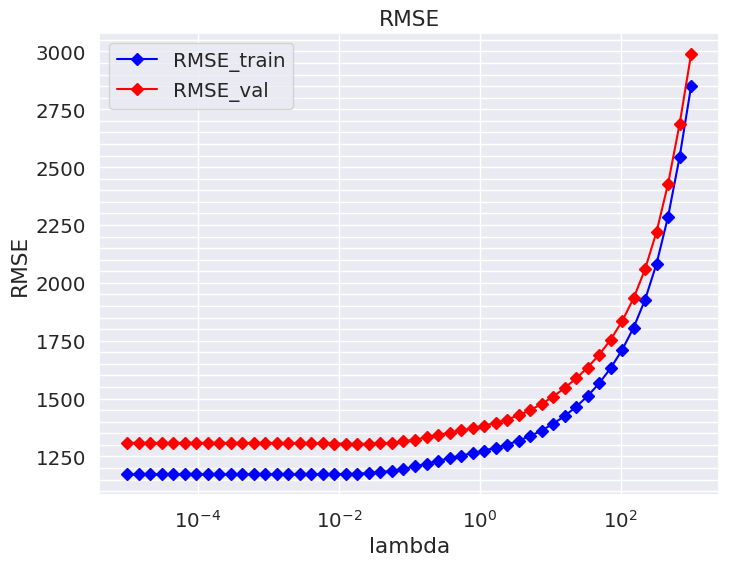

In [20]:
lambdas = np.logspace(-5, 3, 50)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lambdas, [RMSE_train[i] for i in lambdas], 'bD-', label='RMSE_train')
ax.plot(lambdas, [RMSE_val[i] for i in lambdas], 'rD-', label='RMSE_val')

ax.set_xscale('log')
ax.minorticks_on()
ax.grid(which='minor',
        color = 'white',
        linewidth = 1)

plt.xlabel("lambda")
plt.ylabel("RMSE")
plt.title("RMSE")
plt.legend()

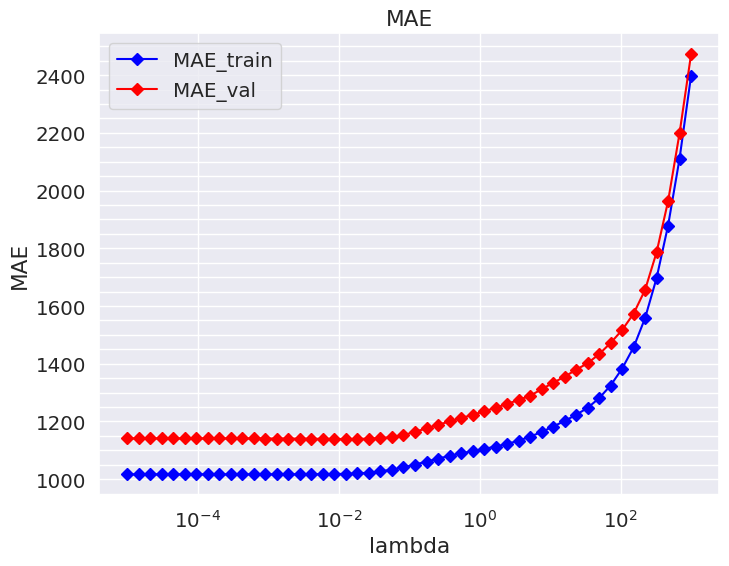

In [21]:
lambdas = np.logspace(-5, 3, 50)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lambdas, [MAE_train[i] for i in lambdas], 'bD-', label='MAE_train')
ax.plot(lambdas, [MAE_val[i] for i in lambdas], 'rD-', label='MAE_val')

ax.set_xscale('log')
ax.minorticks_on()
ax.grid(which='minor',
        color = 'white',
        linewidth = 1)

plt.xlabel("lambda")
plt.ylabel("MAE")
plt.title("MAE")
plt.legend()

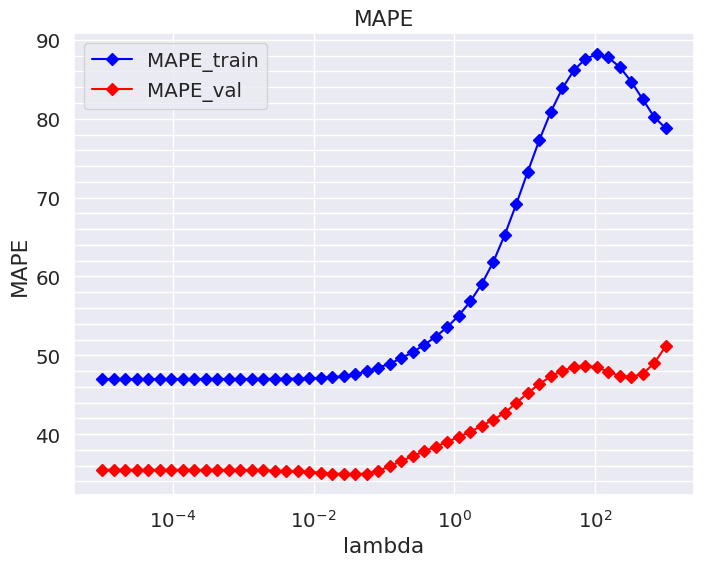

In [23]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lambdas, [MAPE_train[i] for i in lambdas], 'bD-', label='MAPE_train')
ax.plot(lambdas, [MAPE_val[i] for i in lambdas], 'rD-', label='MAPE_val')

ax.set_xscale('log')

ax.minorticks_on()
ax.grid(which='minor',
        color = 'white',
        linewidth = 1)
plt.xlabel("lambda")
plt.ylabel("MAPE")
plt.title("MAPE")
plt.legend()

Постройте также на одном графике кривые зависимости значений оценок коэффициентов от значений гиперпараметра. Какая наблюдается зависимость? Как вы это можете охарактеризовать?

*Замечание*. Возможно, будет информативнее рисовать графики в логарифмическом масштабе. Для наглядности можно также попробовать рисовать одним цветом все кривые, которые относятся к одному *исходному* признаку.

In [24]:
import math

Text(0, 0.5, 'Значение i-го веса')

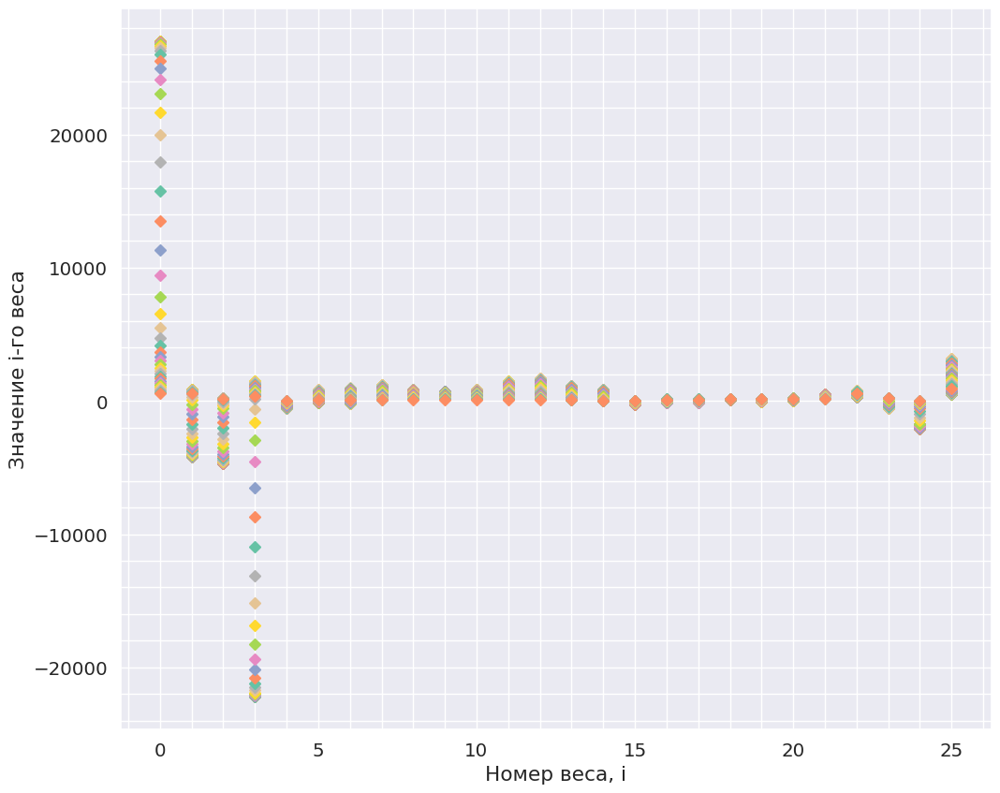

In [25]:
fig, ax = plt.subplots(figsize=(12, 10))

for lambd in lambdas:
    ax.plot(np.arange(len(models[lambd].theta)),models[lambd].theta, 'D', label=f'{round(lambd, 3)}')
# plt.legend()
ax.minorticks_on()
ax.grid(which='minor',
        color = 'white',
        linewidth = 1)
plt.xlabel("Номер веса, i")
plt.ylabel("Значение i-го веса")

Выберите оптимальное значение гиперпараметра и посчитайте ошибку на тестовой выборке.

In [31]:
lambda_opt = sorted(list(zip(lambdas, [MAPE_val[i] for i in lambdas])), key=lambda x: x[1])[0][0]

model = RidgeRegression(0.1)
model.fit(X_train, y_train)
test_preds = model.predict(X_test)

RMSE = metrics.mean_squared_error(y_test, test_preds) ** 0.5 # RMSE
MAE = metrics.mean_absolute_error(y_test, test_preds) # MAE
MAPE = mean_absolute_percentage_error(y_test, test_preds) # MAPE

In [32]:
print(f"RMSE:{round(RMSE, 2)}\nMAE:{round(MAE, 2)}\nMAPE:{round(MAPE, 2)}")

RMSE:1261.5
MAE:1081.55
MAPE:37.71


In [33]:
lambda_opt

0.039069399370546126

Сделайте выводы.

**Вывод:**


После предобработки в наших данных осталось мало линейных зависимостей, поэтому регуляризация особо была не нужна. Результаты обучения модели по сетке для $\lambda$ подтверждают этот факт. Видим, что при маленьких $\lambda$ наша модель справляется лучше. Оптимальное значение подобрано из визуализации функций ошибок для валидационной выборки и составляет $\lambda \approx 0.04$.

### Задача 5.

Предположим, что имеющиеся у нас данные по велопрокату &mdash; большие данные. Конечно же в реальности это не так. Однако, для простой учебной задачи это в самый раз, чтобы ничего ни у кого не подвисало.

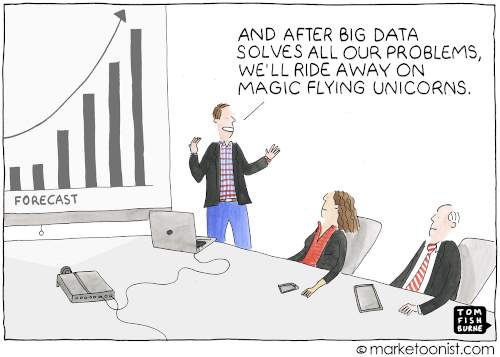

Выберите некоторое начальное приближение оценок коэффициентов, например, в начале координат.

In [36]:
theta

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0.])

Реализуйте процедуру стохастического градиентного спуска для поиска оценок коэффициентов в модели ridge-регрессии. Размер батча (набор объектов на каждой итерации) обычно берут кратно степени двойки, например, 128 или 256. Значение $\lambda$ можно взять из предыдущей задачи.

$\theta_{t+1} = \theta_t - \eta (X^T_{PxB} (X_{BxP}\theta_{Px1} - Y_{Bx1}) + \lambda \theta_{Px1})$

In [39]:
X_train.shape

(438, 25)

In [68]:
np.allclose([-1, 2], [0, 1], atol=1)

True

In [121]:
def SGD_l2reg(X, y, eta, lambd, fit_intercept=True, batch_size=128):
    if fit_intercept:
        X = np.hstack([X, np.ones((X.shape[0], 1))])
    theta  = np.zeros((X.shape[1],))
    
    flag = False
    ind = np.random.choice(X.shape[0], batch_size, replace=True)
    X_batch = X[ind]
    y_batch = y[ind]
    error = 1000*np.ones((X_batch.shape[0], 1))
    i = 0
    while (not np.allclose(error, np.zeros((X_batch.shape[0], 1)), atol=1)) and (i<5000):
        if flag:
            ind = np.random.choice(X.shape[0], batch_size, replace=True)
            X_batch = X[ind]
            y_batch = y[ind]
        theta -= eta*(X_batch.T @ (X_batch.dot(theta) - y_batch) + lambd*theta)
        error = X_batch.T @ (X_batch.dot(theta) - y_batch) + lambd*theta
        flag = True
        i += 1
    return (theta, error, i)

In [129]:
SGD_l2reg(X_train, y_train, 0.003, lambd=lambda_opt)

(array([ 9318.02474063, -3379.35052072, -4072.40807073, -4338.98628683,
         -165.06271344,   927.75444666,   974.01881256,  1186.12190681,
          842.16151871,   639.80524002,   918.73183199,  1406.23575892,
         1634.05716536,  1075.29779114,   836.58790481,  -268.90355867,
          -53.85043259,   -13.77588331,    15.80284948,   -92.67940582,
           31.85095962,   522.35474535,   156.25164605,  -201.77606165,
        -1893.29170337,  3040.59652156]),
 array([-2691.75180812,  1748.44721787, -2773.49204366, -1325.2235465 ,
        -2393.7815963 ,  2805.67588161, -3115.40781762,  3599.9980455 ,
        -2696.40135199,   347.91324627, -5667.63667203,  6692.05969   ,
        -8885.18996087,  2041.68883686,  2160.35370488, -2818.05710325,
         1844.86205803, -3917.75810377,   706.25101812, -4262.34785983,
         3666.44833955,   849.97403015,   855.51255534, -2024.50395689,
          172.21718248, -2543.26265642]),
 5000)

Нарисуйте графики зависимости значений метрик RMSE, MAE, MAPE от номера итерации для обучающей и валидационной выборок. Сколько итераций пришлось совершить?

Посчитайте ошибку на тестовой выборке.

Сделайте выводы.